# **Missing Migrants - An Analysis on the Risk of Seeking Asylum**

Natural and forced crises across the world have always been the spark of mass migrations of refugees seeking asylum. Although, despite many countries having refugee asylum programs, a widespread reluctance to accept refugees during times of crisis still persist. Without a safe home to return to and resistant neighboring counties towards asylum seeking refugees, many migrants take their chances in one of two options:

1. Apply through a country's refugee program where acceptance isn't guaranteed (and unlikely in certain cases)
2. Or, migrate illegally and risk your safety for the possibility of a new start

According to the [United Nations Refugee Agency](https://www.unrefugees.org/refugee-facts/statistics/) - by the end of 2019, 79.9 million individuals were forcibly displaced worldwide as a result of persecution, conflict, violence or human rights violations. And this trend isn't decreasing (8.7 million increase from the previous year). In fact, new displacement numbers remain very high. One person becomes displaced every 3 seconds – less than the time it takes to read this sentence. That’s 20 people who are newly displaced every minute. In 2019, there were over 30,000 new displacements each day.

In this analysis, we will take a data based approach towards looking at trends in migration incidents (death or missing individuals), the number of asylum seeker applications, hot spots for migration, and how all of this data ties together. We will follow the data science pipeline of: 1) data curation, parsing, and management 2) exploratory data analysis 3) and hypothesis testing and machine learing. By following this approach, we hope to capture a greater insight into what factors play into refugee migrations and identify relationships between our different datasets.

## Data Curation, Parsing, and Management

The first step in the data science pipeline is data curation, parsing, and management. The challenge with studying refugee migrations is that there is often a lack of official data due to many refugees being forced to seek asylum illegally or outside mainstream processes. Despite this challenge, the [Missing Migrant Project](https://www.kaggle.com/snocco/missing-migrants-project) was started in 2013 after 368 migrants died in two shipwrecks near the Italian island of Lampedusa in order to track the deaths of migrants, including refugees and asylum-seekers, who have gone missing along mixed migration routes worldwide. We will use data collected in the Missing Migrant Project as the basis for our analysis.

Let's first begin by importing the libraries that we will be using in our analysis of our datasets. 

In [214]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import math
import ast

from sklearn import linear_model, preprocessing
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import IsolationForest
from sklearn.metrics import mean_absolute_error

We will now import our data and take an initial look at what fields are included in this file.

In [233]:
# Import the Missing Migrants csv using pandas
migrantData = pd.read_csv('MissingMigrants-Global-2019-12-31_correct.csv')

# Print the shape of our dataset and show the head
print('migrantData shape: ', migrantData.shape)
migrantData.head()

migrantData shape:  (5987, 20)


,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
0,52673,Mediterranean,"December 30, 2019",2019,Dec,1.0,NaN,1,11.0,NaN,NaN,NaN,Hypothermia,Unspecififed location off the coast of Algeria,El Watan,"35.568972356329, -1.289773129748",Western Mediterranean,https://bit.ly/2FqQHo4,Uncategorized,1
1,52666,Mediterranean,"December 30, 2019",2019,Dec,1.0,NaN,1,NaN,NaN,1.0,NaN,Presumed drowning,"Recoverd on Calamorcarro Beach, Ceuta",El Foro de Ceuta,"35.912383552874, -5.357673338898",Western Mediterranean,https://bit.ly/39yKRyF,Uncategorized,1
2,52663,East Asia,"December 27, 2019",2019,Dec,5.0,NaN,5,NaN,NaN,3.0,NaN,Unknown,"Bodies found on boat near Sado Island, Niigata...","Japan Times, Kyodo News, AFP","38.154018233313, 138.086032653130",NaN,"http://bit.ly/2sCnBz1, http://bit.ly/2sEra83, ...",Eastern Asia,3
3,52662,Middle East,"December 26, 2019",2019,Dec,7.0,NaN,7,64.0,NaN,NaN,NaN,Drowning,"Van lake near Adilcevaz, Bitlis, Turkey","EFE, BBC, ARYnews","38.777228612085, 42.739257582031",NaN,"http://bit.ly/2ZG2Y19, http://bit.ly/2MLamDf, ...",Western Asia,3
4,52661,Middle East,"December 24, 2019",2019,Dec,12.0,NaN,12,NaN,NaN,NaN,NaN,Air strike,"Al-Raqw market in Saada, Yemen","UN Humanitarian Coordinator in Yemen, Qatar Tr...","17.245364805636, 43.239093360326",NaN,"http://bit.ly/2FjolvD, http://bit.ly/2sD42GR, ...",Western Asia,4


Now that we have our dataset imported into our notebook, let's take a look at what this dataset contains. We see that the dataset has just under 6000 observations and 20 variables. Some key variables that stand out are where the incident occurred, the date, the number of individuals missing or dead, and causes of death.

Make note of the large amount of NaN values in our dataset. As we discussed earlier, due to the nature of refugee migrations, it is often difficult to find consistent datasets without missing information. Without a standardized method of tracking refugee migration, there is often gaps in data. This will pose a challenge in our analysis if left undealt with. We will address these gaps in data in the next phase of data processing in order to perform our analysis without running into issues.

The second dataset we will consider in this analysis is the frequency of approved/rejected asylum cases in regions of interest over time. The [United Nations High Comissioner for Refugees](https://www.kaggle.com/unitednations/refugee-data?select=asylum_seekers.csv) covers the movement of asylum seekers and records these statistics. We will use this dataset as cross comparison values to our Missing Migrant dataset to see if we can find relationships between migrant incidents and the number of applications to destination countries.

We will now import the UNHCR dataset so we can take a look at what information is captured:

In [234]:
# Import the asylum seeker applications and remove observations with NaN values in the 'Applied during year' column
cases = pd.read_csv('asylum_seekers.csv',low_memory=False)
cases = cases[cases['Applied during year'].notna()]

# Print the shape and head of our dataset
print('cases shape: ', cases.shape)
cases.head()

cases shape:  (122863, 14)


,Year,Country / territory of asylum/residence,Origin,RSD procedure type / level,Tota pending start-year,of which UNHCR-assisted(start-year),Applied during year,decisions_recognized,decisions_other,Rejected,Otherwise closed,Total decisions,Total pending end-year,of which UNHCR-assisted(end-year)
0,2000,Zimbabwe,Afghanistan,G / FI,0.0,0.0,5.0,5.0,0.0,0.0,0.0,5.0,0.0,0.0
1,2000,South Africa,Afghanistan,G / FI,8.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,8.0,0.0
2,2000,Uzbekistan,Afghanistan,U / FI,265.0,265.0,2156.0,747.0,0.0,112.0,327.0,1186.0,1235.0,1235.0
3,2000,United States of America,Afghanistan,G / EO,196.0,0.0,225.0,151.0,0.0,31.0,68.0,250.0,171.0,0.0
4,2000,United States of America,Afghanistan,G / IN,193.0,0.0,218.0,182.0,0.0,51.0,40.0,273.0,150.0,0.0


Great! We now have two time series based datasets where information is dependent on the date in which the statistics are recorded. This will be useful later in our analysis when we want to compare the changes in trends of our variables as time progresses. 

Although, looking at the above two datasets we can see that there may be an issue in how the date information is recorded. In the Missing Migrant dataset, our variables are captured in terms of specific date entries (i.e. Month/Day/Year). Looking at the above dataset from UNHCR, our variables are summed to the total value counts per year. In order to account for this difference, we will import an accompanying dataset from the UNHCR that includes monthly logged values. 

Let's see what this monthly reported cases dataset looks like by importing it below:

In [235]:
# Import the monthly asylum seeker applications and remove observations with NaN values in the 'Value' column
monthlyCases = pd.read_csv('asylum_seekers_monthly.csv', low_memory=False)
monthlyCases = monthlyCases[monthlyCases['Value'].notna()]

# Capture the months of the year to use later in our analysis
months = monthlyCases['Month'][0:12]

# Print the shape and head of the monthlyCases dataset
print('monthlyCases shape: ', monthlyCases.shape)
monthlyCases.head()

monthlyCases shape:  (320348, 5)


,Country / territory of asylum/residence,Origin,Year,Month,Value
0,Australia,Afghanistan,1999,January,8.0
1,Australia,Afghanistan,1999,February,10.0
2,Australia,Afghanistan,1999,March,25.0
3,Australia,Afghanistan,1999,April,25.0
4,Australia,Afghanistan,1999,May,7.0


Now that all of our datasets are imported we can move on to our data processing and exploratory data analysis phase to get a better understanding of what our data captures, the trends that exist in our data, and prepare our datasets for further analysis in the hypothesis testing and machine learning phase.

# Data Processing & Exploratory Data Analysis

Let's first begin by understanding what is in our Missing Migrants dataset. This will dictate how we can use this information to hypothesize relationships between our data, where we need to fill in gaps, and classify what information is important versus what is not needed. 

We are going to first look at the 'Region of Incident' variable in order to get a better understanding of where a majority of our incident cases are occuring. By isolating this column in our dataset, we can take a look at the number of distinct values in this column to see how our data varies. Using the .value_counts() function we will measure the counts of values and print it in a formatted way to illustrate the variation in this data.

In [236]:
# Get the value counts in our 'Region of Incident' column
regFreq = migrantData['Region of Incident'].value_counts().to_dict()

# Format our value counts and print to screen
print('{:<40} {:<15} \n'.format('Region', 'Frequency of Incidents'))
for name, freq in regFreq.items():
    print('{:<40} {:<15}'.format(name, freq))

Region                                   Frequency of Incidents 

US-Mexico Border                         1612           
North Africa                             1262           
Mediterranean                            1085           
Sub-Saharan Africa                       510            
Central America                          364            
Europe                                   301            
Horn of Africa                           238            
South Asia                               183            
Middle East                              182            
Southeast Asia                           137            
Caribbean                                68             
South America                            36             
East Asia                                6              
North America                            2              
Central Asia                             1              


From first glance we see that the majority of migration incidents occur at the US-Mexico border, North Africa, and the Mediterranean. Although, this comparison may be misleading when analyzing the actual risk involved with migrating. Let's ask ourselves a few questions: 

1. How can we best quantify the risk involved in migrating (death count, number of individuals missing, ratio of deaths to survivors, etc.)
2. What causes certain migrations to be more dangerous than others in terms of number of lives lost or missing?
3. What international factors affect the risk involved in refugee migrations?

It may not be enough to quantify the risk involved in migrating by simply the number of cases per region. Let's take an alternate view of our dataset by visualizing a comparison between region and the number of deaths per case:

In [237]:
# Generate a map using folium and osm
map_osm = folium.Map(location=[0, 0], zoom_start=2, min_zoom=2, max_zoom=8)

# Prepare our data by removing NaN values from our location variable
migrantVisData = migrantData[migrantData['Location Coordinates'].notna()]

# Iterate through our data and append values to the list as coordinate objects
holder = []
for num in migrantVisData['Location Coordinates']:
    holder.append(ast.literal_eval(num))

# Append this list as a column to our map dataset
migrantVisData['latLong'] = holder

# Iterate over our data and add observations to our map
for index, row in migrantVisData.iterrows():
    deathCount = row['Number Dead']
    # Format data to make easier to view
    if math.isnan(deathCount): deathCount = 1  
    if deathCount > 500: deathCount = 300
            
    # Add circle for each observation
    folium.CircleMarker(
        location=row['latLong'],
        radius=deathCount/4,
        popup=row[['Reported Date', 'Number Dead', 'Cause of Death', 'Location Coordinates']],
        color='#3186cc',
        fill=True,
        fill_color='#3186cc'
    ).add_to(map_osm)

map_osm

C:\Users\dtsch\anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


Let's take a look at the information displayed in the map above. Zooming into the cluster in North Africa, we see a large number of incidents occuring above Libya's and Tunisia's borders during the years from 2014-2016. According to [Migration Data Portal](https://migrationdataportal.org/regional-data-overview/northern-africa) the six countries in Northern Africa – Algeria, Egypt, Libya, Morocco, Sudan and Tunisia – have historically been and remain significant countries of migrant destination, transit and departure. Economic, environmental and political instability contribute to the mixed migration patterns observed in this sub-region. 

Migrations from Northern Africa into Europe during this timeframe of 2014-2016 will be the area of focus for our analysis. This makes sense for our implementation because this timeframe capture the heights of migration incidents within our Missing Migrants dataset and these years are captured by both our datasets. And while we would prefer to capture more datapoints in our analysis to make our claims more robust, this will be a sufficient number of observations for our purposes.

We will begin by filtering our data so that we only include observations between 2014 and 2016. While we are doing this, let's also filter out observations that contain NaN values in our variables of interest. Specifically, we are going to be looking at observations where the origin country is in Africa and the destination country is in Europe. We are narrowing down our fields like this in order to study the movement of individuals from Northern Africa to Europe: the region of interest where a majority of migrant incidents occured from 2014 to 2016. To do this, we are going to import a supplmental dataset that contains countries and their corresponding continent.

In [238]:
# Read in our countries and continents dataset
countryToContinent = pd.read_excel('countries.xlsx')

# Parse out the African and European countries
africanCountry = countryToContinent[(countryToContinent['continent'] == 'Africa')]['country']
europeanCountry = countryToContinent[(countryToContinent['continent'] == 'Europe')]['country']

# Filter our cases dataset by the years and countries we are intersted in
migrantCases = cases[(cases['Year'].between(2014, 2016)) & (cases['Origin'].isin(africanCountry))
                  & (cases['Country / territory of asylum/residence'].isin(europeanCountry))]

# Filter our monthlyCases dataset by the years and countries we are interested in
migrantMonthlyCases = monthlyCases[(monthlyCases['Year'].between(2014, 2016)) & 
                                   (monthlyCases['Origin'].isin(africanCountry)) & 
                                   (monthlyCases['Country / territory of asylum/residence'].isin(europeanCountry))]

# Filter our migrantData dataset by the years and countries we are interested in
incidents = migrantData[(migrantData['Reported Year'].between(2014, 2016)) & 
                        ((migrantData['Region of Incident'] == 'Mediterranean') |
                        (migrantData['Region of Incident'] == 'North Africa'))]
# Remove NaN observations from our 'Reported Date' column
incidents['Reported Date'] = incidents[incidents['Reported Date'].notna()]

C:\Users\dtsch\anaconda3\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Taking a look at our processed dataframes, we now see that we only capture the observations between 2014 and 2016. 

In [156]:
display(incidents)

,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
3660,43026,Mediterranean,43026,2016,Dec,2.0,NaN,2,NaN,NaN,NaN,NaN,Drowning,"Bodies recovered near Zarzia or Ben Gardane, T...",IOM Tunisia,"33.206798600000, 11.220954700000",Central Mediterranean,NaN,Uncategorized,4
3662,43655,North Africa,43655,2016,Dec,2.0,NaN,2,NaN,NaN,NaN,NaN,Sickness and lack of access to medicines,"Bani Walid, Libya",Mixed Migration Monitoring Mechanism Initiativ...,"31.760201600000, 13.977697100000",NaN,NaN,Northern Africa,2
3663,44538,North Africa,44538,2016,Dec,2.0,NaN,2,NaN,NaN,NaN,NaN,Shot,"Tripoli, Libya",MHub,"32.887209400000, 13.191338300000",NaN,NaN,Northern Africa,2
3664,44540,North Africa,44540,2016,Dec,2.0,NaN,2,NaN,NaN,NaN,NaN,Vehicle Accident,"Unspecified location, Libya",MHub,"27.549510052990, 13.317198187500",NaN,NaN,Northern Africa,2
3665,44542,North Africa,44542,2016,Dec,1.0,NaN,1,NaN,NaN,NaN,NaN,Dehydration,"Sahara Desert, between Agadez, Niger and Tripo...",MHub,"22.734385541312, 12.939331408172",NaN,NaN,Northern Africa,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5947,39405,Mediterranean,39405,2014,Mar,1.0,NaN,1,NaN,NaN,NaN,NaN,Asphyxiation,Mediterranean,Global post,"34.979700000000, 12.656300000000",Central Mediterranean,http://bit.ly/1lOxCNv,Uncategorized,1
5957,39230,Mediterranean,39230,2014,Feb,7.0,NaN,7,NaN,NaN,NaN,NaN,Drowning,Libyan Coast,Libya herald,"33.159700000000, 15.183100000000",Central Mediterranean,http://bit.ly/1lvR4Ka,Uncategorized,1
5965,39228,Mediterranean,39228,2014,Feb,2.0,0.0,2,121.0,NaN,2.0,NaN,Unknown,Italy waters,Malta Today,"34.564500000000, 15.886200000000",Central Mediterranean,http://bit.ly/V7JIqE,Uncategorized,1
5970,39404,Mediterranean,39404,2014,Feb,15.0,0.0,15,0.0,NaN,1.0,NaN,Shot,Ceuta waters,L'Espresso,"35.879300000000, -5.364070000000",Western Mediterranean,"http://bit.ly/U4b8wu, http://bit.ly/2kyBK8g, h...",Uncategorized,1


In [157]:
display(migrantCases)

,Year,Country / territory of asylum/residence,Origin,RSD procedure type / level,Tota pending start-year,of which UNHCR-assisted(start-year),Applied during year,decisions_recognized,decisions_other,Rejected,Otherwise closed,Total decisions,Total pending end-year,of which UNHCR-assisted(end-year)
98284,2014,Austria,Angola,G / FA,0.0,0.0,7.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0
98286,2014,Belgium,Angola,G / FI,102.0,0.0,88.0,10.0,0.0,159.0,40.0,209.0,13.0,0.0
98287,2014,Belgium,Angola,G / JR,26.0,0.0,112.0,0.0,0.0,95.0,5.0,100.0,31.0,0.0
98288,2014,Belgium,Angola,G / RA,0.0,0.0,24.0,0.0,0.0,0.0,25.0,25.0,0.0,0.0
98293,2014,Switzerland,Angola,G / AR,2.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129703,2016,Norway,Zimbabwe,G / FI,NaN,NaN,5.0,NaN,NaN,NaN,NaN,5.0,NaN,NaN
129707,2016,Portugal,Zimbabwe,G / FI,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
129711,2016,Sweden,Zimbabwe,G / AR,0.0,NaN,13.0,0.0,0.0,NaN,NaN,7.0,6.0,NaN
129712,2016,Sweden,Zimbabwe,G / FI,7.0,NaN,18.0,NaN,0.0,5.0,15.0,21.0,NaN,NaN


In [159]:
display(migrantMonthlyCases)

,Country / territory of asylum/residence,Origin,Year,Month,Value
266616,Albania,Congo,2014,December,1.0
266618,Albania,Eritrea,2014,May,5.0
266619,Albania,Eritrea,2014,June,4.0
266620,Albania,Eritrea,2014,July,7.0
266621,Albania,Eritrea,2014,August,3.0
...,...,...,...,...,...
329278,United Kingdom of Great Britain and Northern I...,Zimbabwe,2016,August,26.0
329279,United Kingdom of Great Britain and Northern I...,Zimbabwe,2016,September,22.0
329280,United Kingdom of Great Britain and Northern I...,Zimbabwe,2016,October,14.0
329281,United Kingdom of Great Britain and Northern I...,Zimbabwe,2016,November,29.0


Now we want to see if any relationships exist between the variables captured in our processed datasets. Let's consider three variables that may be related to the number of migrant incidents that occur during a given month:

1. Number of asylum seeking applications submitted to European countries
2. Number of asylum applications rejected from European countries
3. Total number of migrants missing or dead

To gain a better understanding of how these variables relate to one another we are going to visualize these counts over the three years in our timeframe. The logical visual of choice here would be a bar plot. We still need to do some processing of our datasets to prepare the necessary formatted time series for plotting. To do this, we are going to isolate the columns of interest, sum the observations for each column based on our grouping parameter, and change certain datatypes to comply with the other datasets (i.e. changing migrantCases to integer values).

C:\Users\dtsch\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


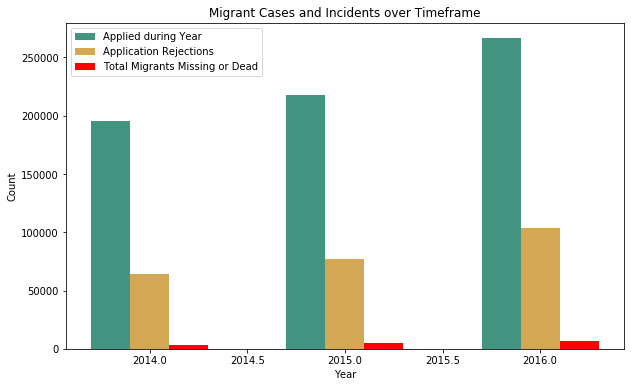

In [239]:
# Change our year values from strings to integers
migrantCases['Applied during year'] = migrantCases['Applied during year'].apply(pd.to_numeric)

# Group our datasets by the year value and sum the observations
asylumApps = migrantCases.groupby(['Year'])['Applied during year'].sum().reset_index()
asylumRejections = migrantCases.groupby(['Year'])['Rejected'].sum().reset_index()
migrantIncidents = incidents.groupby(['Reported Year'])['Total Dead and Missing'].sum().reset_index()

# Add our new columns to the asylumApps dataframe
asylumApps['Application Rejections'] = asylumRejections['Rejected']
asylumApps['Total Missing or Dead'] = migrantIncidents['Total Dead and Missing']

# Plot each of these variables as bars on a bar plot by year
plt.figure(figsize=(10,6))
ax = plt.subplot(111)
ax.bar(asylumApps['Year']-0.2, asylumApps['Applied during year'], width=0.2, color='#439480', align='center')
ax.bar(asylumApps['Year'], asylumApps['Application Rejections'], width=0.2, color='#d4a755', align='center')
ax.bar(asylumApps['Year']+0.2, asylumApps['Total Missing or Dead'], width=0.2, color='r', align='center')

plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Migrant Cases and Incidents over Timeframe')
ax.legend(['Applied during Year', 'Application Rejections', 'Total Migrants Missing or Dead'])
plt.show()

From an initial look, we see that all three variables increase with each other. So to speak, as the number of applications increases, the number of rejected applications increases, and the total number of migrants missing or dead also increases. This makes sense just from our logical understanding of forced migrations because as the demand for asylum increases we expect the number of applications to also increase. That being said, accepting countries institute a cap for asylum seeking refugees. Through this vetting process, as countries experience an influx of applications the countries in turn issue increasing numbers of rejections. 

As demand is still increasing and the number of rejections increases, asylum seeking refugees are forced to take approach number 2: migrate illegally with the risk of personal safety. Because of these increases in trends, it makes sense that the region would experience increasing numbers of missing or dead migrants.

Although this provides a relatively good overhead view of trends in our data, it would help to develop a more robust means of measuring the relationship between these variables. In order to do this, we are going to take a more granular approach towards viewing our data by plotting monthly applications and monthly number of dead or missing migrants against each other over our timeframe. To accomplish this, we have to process our data a little more to get it into the right format for plotting:

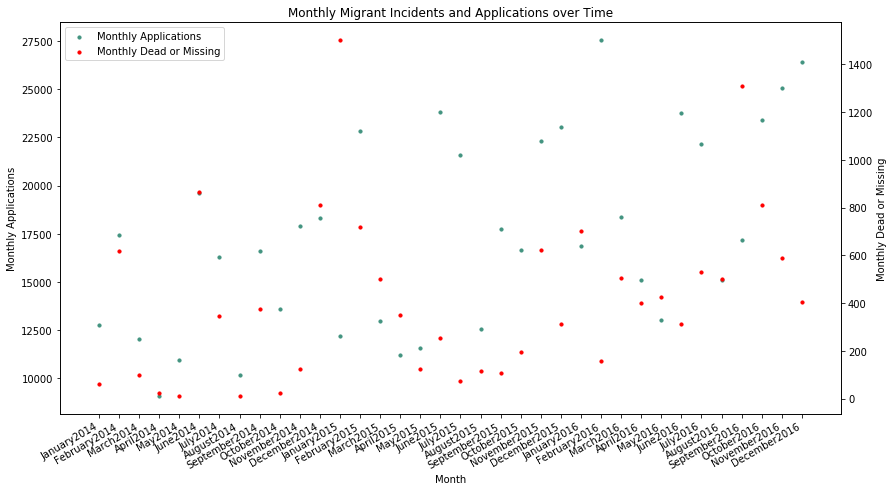

In [240]:
# Group our datasets by month and sum the variables we are interested in
incidentMonths = incidents.groupby(['Reported Year','Reported Month']).agg({'Total Dead and Missing': 'sum'})
monthlyApps = migrantMonthlyCases.groupby(['Year','Month']).agg({'Value': 'sum'})

# Iterate over the months and append the corresponding years to fill our x-axis dataset
monthAndYear = []
for i in range(0,3):
    for month in months:
        if i == 0: monthAndYear.append(month + '2014')
        elif i == 1 < 25: monthAndYear.append(month + '2015')
        else: monthAndYear.append(month + '2016')

# Create a scatterplot of our monthly applications and monthly dead or missing datasets
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

# Rotate the x-axis labels
plt.xticks(rotation=90)

l1 = ax1.scatter(monthAndYear, monthlyApps['Value'], s=10, c='#439480', label='Monthly Applications')
l2 = ax2.scatter(monthAndYear, incidentMonths['Total Dead and Missing'], s=10, c='r', label='Monthly Dead or Missing')

fig.set_figheight(8)
fig.set_figwidth(14)

ax1.set_xlabel('Month')
ax1.set_ylabel('Monthly Applications')
ax2.set_ylabel('Monthly Dead or Missing')
plt.title('Monthly Migrant Incidents and Applications over Time')
fig.autofmt_xdate()
plt.legend([l1,l2], ['Monthly Applications', 'Monthly Dead or Missing'], loc='upper left')

plt.show()

Looking at our scatter plot, we can see that there might be a relationship between these two variables. In many months, we see the number of migrant incidents following similar rises and drops compared to the number of monthly asylum applications. These two variables will be the basis of our analysis in the following section where we will fit a linear model to our data and determine if a statistically probable correlation exists between these variables.

# Hypothesis Testing & Machine Learning

We are going to first fit a linear model on our data as is to see what the resulting linear regression looks like. In addition to this, we are going to print certain values to the screen.

Coefficients: 
 [0.01287835]
Mean squared error: 115364.39
Coefficient of determination: -0.52


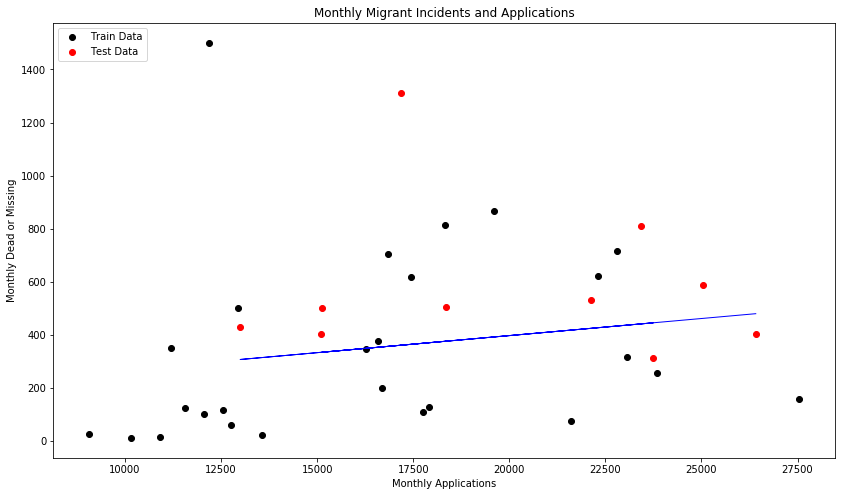

In [241]:
# Reshape our data to prepare for our linear regression
migrants_X = monthlyApps['Value'].values.reshape(-1, 1)
migrants_y = incidentMonths['Total Dead and Missing'].values

# Split data into train and test datasets
migrants_X_train = migrants_X[:-10]
migrants_X_test = migrants_X[-10:]

migrants_y_train = migrants_y[:-10]
migrants_y_test = migrants_y[-10:]

# Fit a linear regression on the data
regr = linear_model.LinearRegression()
regr.fit(migrants_X_train, migrants_y_train)

# Predict y values based on our regression
migrants_y_pred = regr.predict(migrants_X_test)

# The coefficients
print('Coefficients: \n', regr.coef_)
# The mean squared error
print('Mean squared error: %.2f' % mean_squared_error(migrants_y_test, migrants_y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f' % r2_score(migrants_y_test, migrants_y_pred))

# Plot outputs
fig, ax3 = plt.subplots()

s1 = ax3.scatter(migrants_X_train, migrants_y_train,  color='black')
s2 = ax3.scatter(migrants_X_test, migrants_y_test,  color='red')
l1 = ax3.plot(migrants_X_test, migrants_y_pred, color='blue', linewidth=1)

fig.set_figheight(8)
fig.set_figwidth(14)

ax3.set_xlabel('Monthly Applications')
ax3.set_ylabel('Monthly Dead or Missing')
plt.title('Monthly Migrant Incidents and Applications')
plt.legend([s1,s2], ['Train Data', 'Test Data'], loc='upper left')

plt.show()

Great! We see a slight increase in our regression, but looking at the coefficient this positive slope is pretty small. In addition to having some outliers in our dataset, the difference in values between the x axis and y axis is pretty large. In order to remedy this, let's normalize our data and remove outliers to make our analysis more robust.

Shape before removing outliers:  (24, 1) (24, 1)
Shape after removing outliers:   (21, 1) (21, 1)
Mean Absolute Error: 0.204
Coefficients: 
 [[0.29622522]]
Mean squared error: 0.05
Coefficient of determination: 0.25


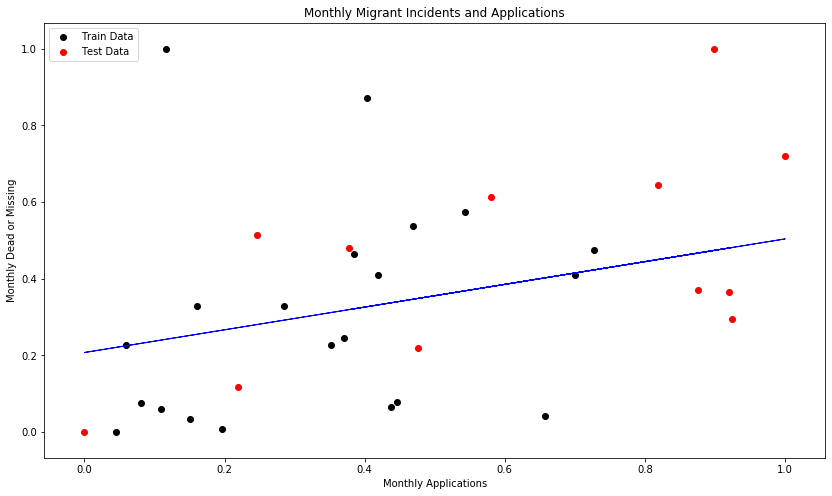

In [242]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(migrants_X, migrants_y, test_size=0.33, random_state=1)

# Remove outliers from train and test datasets
X_train = min_max_scaler.fit_transform(X_train)
X_test = min_max_scaler.fit_transform(X_test)
y_train = min_max_scaler.fit_transform(y_train.reshape(-1, 1))
y_test = min_max_scaler.fit_transform(y_test.reshape(-1, 1))

# summarize the shape of the training dataset
print('Shape before removing outliers: ', X_train.shape, y_train.shape)
# identify outliers in the training dataset
iso = IsolationForest(contamination=0.1)
yhat = iso.fit_predict(X_train)
# select all rows that are not outliers
mask = yhat != -1
X_train, y_train = X_train[mask, :], y_train[mask]
# summarize the shape of the updated training dataset
print('Shape after removing outliers:  ', X_train.shape, y_train.shape)
# fit the model
model = LinearRegression()
model.fit(X_train, y_train)
# evaluate the model
yhat = model.predict(X_test)
# evaluate predictions
mae = mean_absolute_error(y_test, yhat)
print('Mean Absolute Error: %.3f' % mae)

# The coefficients
print('Coefficients: \n', model.coef_)
# The mean squared error
print('Mean squared error: %.2f' % mean_squared_error(y_test, yhat))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f' % r2_score(y_test, yhat))

# Plot outputs
fig, ax3 = plt.subplots()

s1 = ax3.scatter(X_train, y_train,  color='black')
s2 = ax3.scatter(X_test, y_test,  color='red')
l1 = ax3.plot(X_test, yhat, color='blue', linewidth=1)

fig.set_figheight(8)
fig.set_figwidth(14)

ax3.set_xlabel('Monthly Applications')
ax3.set_ylabel('Monthly Dead or Missing')
plt.title('Monthly Migrant Incidents and Applications')
plt.legend([s1, s2], ['Train Data', 'Test Data'], loc='upper left')

plt.show()

From the printed results, we see that by using isolation forests and the mask generated from it, we are able to successfully identify and remove 3 outlier observations from our dataset. In addition to this, using min_max_scaler allows us to normalize our data from 0 to 1. This provides us a better window to view our linear regression. We see that in fact this does generate better results than the previous linear regression by having a larger coefficient and smaller mean squared error. This training dataset is what we will use to test our null hypothesis:

H0 - There exists no relationship between the number of asylum seeking applications submitted in a month (from African to European countries between 2014 and 2016) and the number of migrant incidents (missing or dead) during that same month.

We will use OLS to print our regression results to the screen:

In [243]:
# Print a formatted summary of our regression results using OLS
model = sm.OLS(X_train, y_train)
results = model.fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.513
Model:                            OLS   Adj. R-squared (uncentered):              0.488
Method:                 Least Squares   F-statistic:                              21.03
Date:                Sun, 20 Dec 2020   Prob (F-statistic):                    0.000179
Time:                        11:30:03   Log-Likelihood:                         -2.8659
No. Observations:                  21   AIC:                                      7.732
Df Residuals:                      20   BIC:                                      8.776
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

From the above results, we see that our overall P-value is 0.000179! This is statistically significant because having a P-value less than 0.05 means that we are able to reject our null hypothesis. This tells us that there is likely a relationship between the number of asylum seeking applications and migrant incidents that occur in a month during our time period of 2014-2016 and when migration is from African countries to European countries. Despite this, we observe that our R-squared value is 0.513. The larger this value is, the better our regression fits our results. Thus, because this value isn't greater than it is, we may have to reconsider the validity of our ability to truly reject the null hypothesis. 

# Conclusion

After analyzing our results, it seems that there may exist a correlation between the number of asylum seeker applications and migrant incidents that occur in a month! We first saw this relationship in our "Monthly Migrant Incidents and Applications" time series scatter plot and supported this hypothesis through our regression results. While our P-value is below the critical 0.05 to reject the null hypothesis, there are some areas of concern for our analysis. One large concern in the validity of this experiment is the number of observations that we were able to study. Because our datasets only overlap in the years 2014 to 2016, this means that we only had 36 distinct observations to start with. After splitting our datasets into train and test sets and removing outliers using isolation forests, we ended up with only 21 observations in our train dataset. 

In order to make our analysis more robust in the future, it would be good to scrape data from sources that have more years of overlap. If we were to compare these variables over a 5 or even 10 year period, we would be able to accept or reject our hypothesis that there exists a correlation between applications and incidents with greater confidence. In addition to this, it would also help our analysis if we were able to obtain monthly observations of the number of applications rejected. This is another area of interest, but we weren't able to incude rejected applications in our regression because this variable was only recorded as yearly statistics. 

If we developed our analysis process and was able to determine that there existed a correlation with greater confidence, we could use our applications dataset to create a predictive model for the number of incidents that would occur in future months. One possibility for this would be to use ARIMA to develop a predictive model on the mean total and rejected asylum applications that European countries capture during monthly periods and use this model to predict the number of migrant incidents during that same month. We could then compare these predicted values against our actual incident dataset to determine how well our modelled results predict our actual results. This could help countries part of the EU and other organizations to predict asylum capacity requirements in order to minimize the number of migrant related incidents in our region of interest. Additionally, in our future analysis, we should consider other variables captured in our incident dataset to develop a greater understanding of what factors play into the risk associated with migrations. 